In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation
import pydicom
from utils import *
from IPython.display import HTML

# MRI FILES

In [30]:
path = r'.\DICOM_Files\DICOM_Files\MRI\036_000002_000001_1.3.12.2.1107.5.2.43.67093.2023060915435382064195103.dcm'
ds = read_dicom(path)

<class 'bytes'>
1638400
b'\x00\x00'


In [31]:
arr = ds.pixel_array
print(arr.shape)
print(arr.dtype)
print(np.min(arr))
print(np.max(arr))

(8, 320, 320)
uint16
0
1292


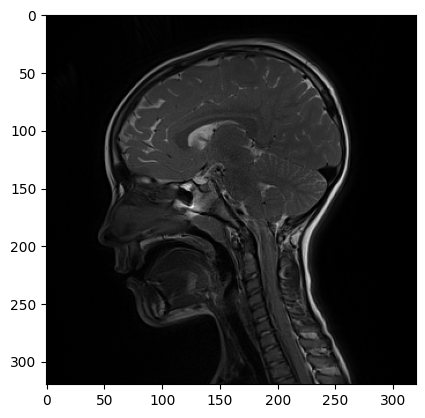

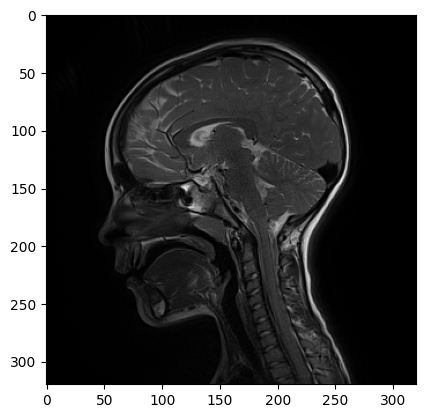

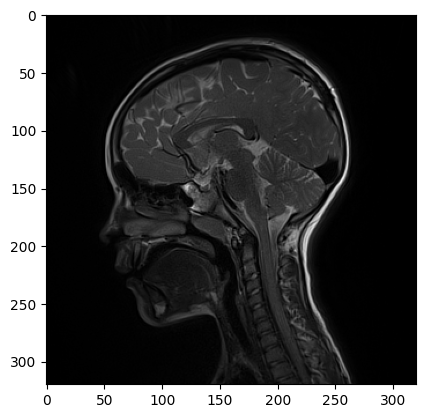

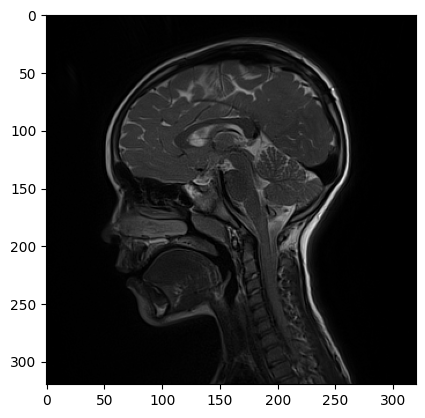

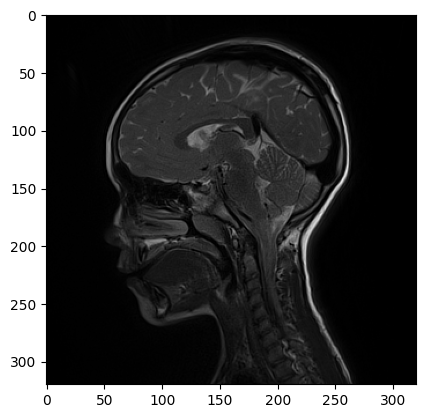

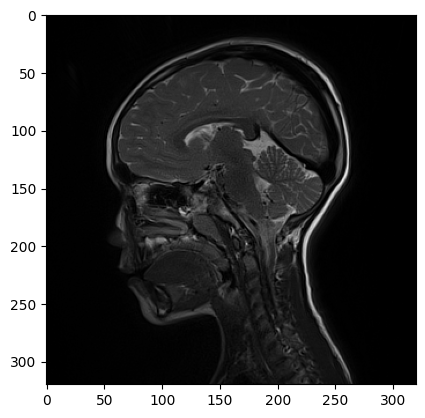

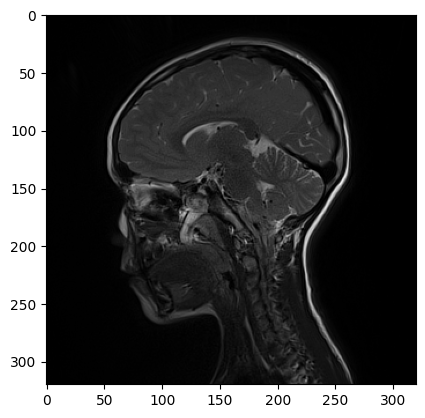

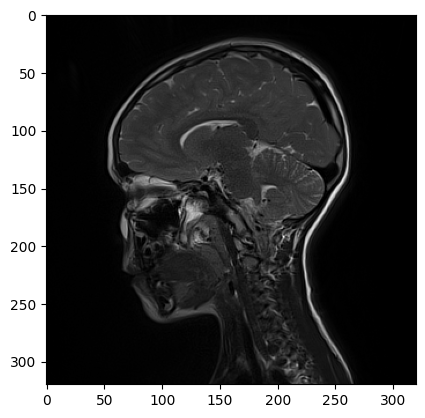

In [5]:
for i in arr:
    plt.figure()
    plt.imshow(i, cmap="gray")
    plt.show()

# ULTRASOUND FILES

In [3]:
path = r'.\DICOM_Files\DICOM_Files\US\20230616114956_013.DCM'
ds2 = pydicom.dcmread(path)
print(type(ds2.PixelData))
print(len(ds2.PixelData))
print(ds2.PixelData[:2])

<class 'bytes'>
84960000
b'\x00\x00'


In [7]:
print(hasattr(ds2, "SliceLocation"))

False


In [4]:
arr2 = ds2.pixel_array
print(arr2.shape)
print(arr2.dtype)
print(np.min(arr2))
print(np.max(arr2))

(59, 600, 800, 3)
uint8
0
255


In [27]:
frame_time = ds2.FrameTime
frame_rate = 1000/frame_time
print('Frame time (ms): ', frame_time)
print('Frame rate (fps): ', frame_rate)

Frame time (ms):  41.004
Frame rate (fps):  24.38786459857575


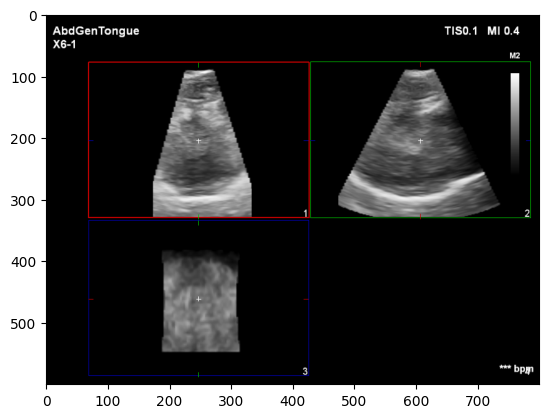

In [17]:
plt.imshow(arr2[0])
plt.show()

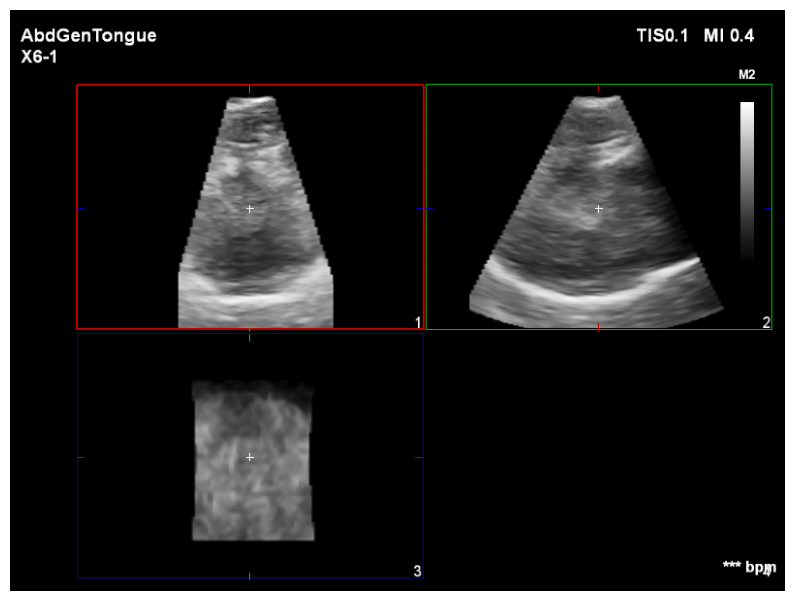

In [29]:
from utils import *
anim = animate(arr2, interval=200)
HTML(anim.to_jshtml())